# Preámbulo

In [104]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pyvisa as visa
import pandas as pd
import scipy.optimize as opt

# Definiciones del Circuito

In [62]:
L = 0.01 # Henrios
#R1 = 99000 # Ohmios
#R2 = 99.4 # Ohmios
#R3 = 19.0 # Ohmios
R = 984 # Ohmios
#C1 = 0.0001 # Faradios
C = 0.00001 # Faradios

w0 = 1/np.sqrt(L*C)
f0 = w0/(2*np.pi)
Q = np.sqrt(L/C)/R

print(f"La frecuencia angular de corte es {w0} rad/s")
print(f"La frecuencia de corte es {f0} Hz")
print(f"La Q es {Q}")

La frecuencia angular de corte es 3162.277660168379 rad/s
La frecuencia de corte es 503.2921210448703 Hz
La Q es 0.03213696809114207


# PyVisa

In [63]:
rm = visa.ResourceManager()
recursos = rm.list_resources()
print(f"Instrumentos detectados: {recursos}")

Instrumentos detectados: ('USB0::0x0699::0x03C4::C041039::INSTR', 'USB0::0xF4EC::0xEE38::SDG1XCA4161035::INSTR', 'ASRL1::INSTR', 'ASRL10::INSTR')


In [64]:
osc = rm.open_resource('USB0::0x0699::0x03C4::C041039::INSTR')
idnosc = osc.query('*IDN?').strip()
print(f"Conectado a: {idnosc}")

Conectado a: TEKTRONIX,TBS1102C,C041039,CF:91.1CT FV:v1.29.38; FPGA:v20.78;


In [65]:
gen = rm.open_resource('USB0::0xF4EC::0xEE38::SDG1XCA4161035::INSTR')
idngen = gen.query('*IDN?').strip()
print(f"Conectado a: {idngen}")

Conectado a: Siglent Technologies,SDG1062X,SDG1XCA4161035,1.01.01.22


In [66]:
f_min = 40.0     # Límite inferior arbitrario
f_max = 150000.0  # Límite superior arbitrario
N_por_lado = 15  # Puntos en cada mitad (total: 2*N_por_lado - 1 = 29)

# Genera desde f_min hasta f0, y desde f0 hasta f_max sin duplicar f0
lado_izq = np.geomspace(f_min, f0, num=N_por_lado)
lado_der = np.geomspace(f0, f_max, num=N_por_lado)[1:]

frecuencias = np.concatenate([lado_izq, lado_der])

Trabajando con frecuencia 40.0 Hz


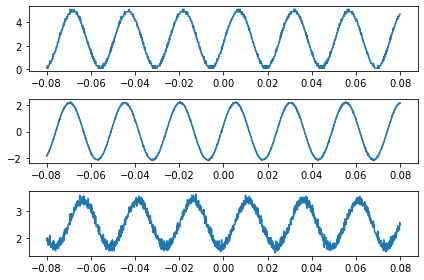

Trabajando con frecuencia 47.930756882811906 Hz


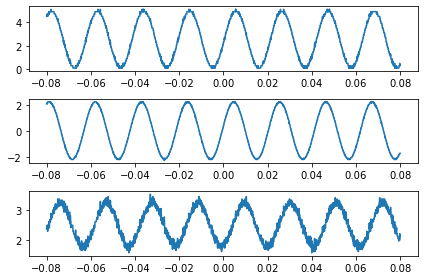

Trabajando con frecuencia 57.43393638398057 Hz


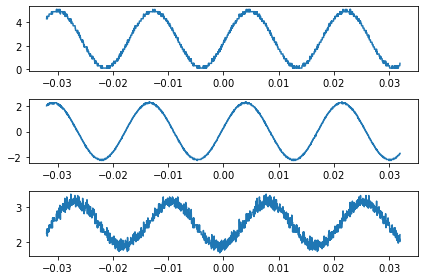

Trabajando con frecuencia 68.82130104108647 Hz


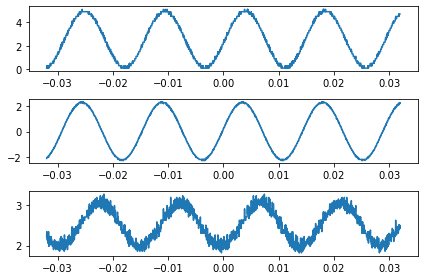

Trabajando con frecuencia 82.46642621397815 Hz


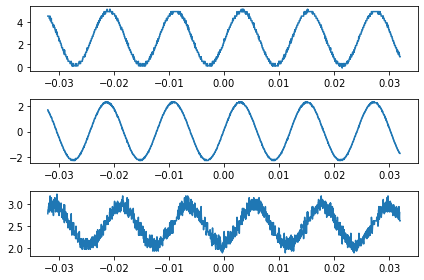

Trabajando con frecuencia 98.81695564641342 Hz


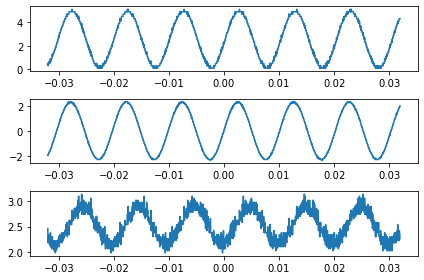

Trabajando con frecuencia 118.40928692469632 Hz


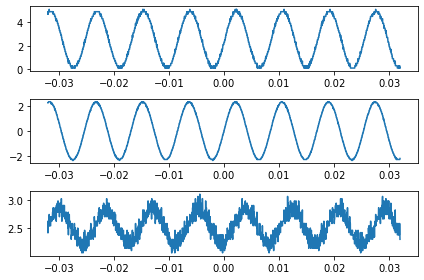

Trabajando con frecuencia 141.88616860636841 Hz


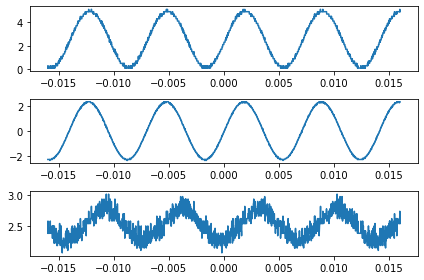

Trabajando con frecuencia 170.01778631263772 Hz


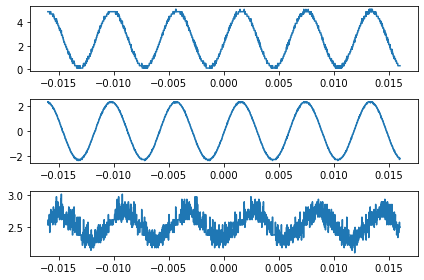

Trabajando con frecuencia 203.72702953762277 Hz


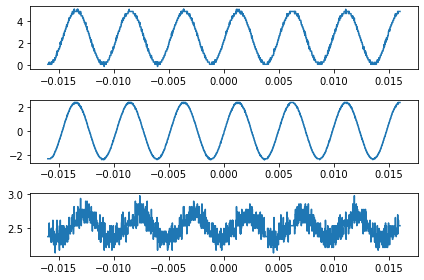

Trabajando con frecuencia 244.11976808063085 Hz


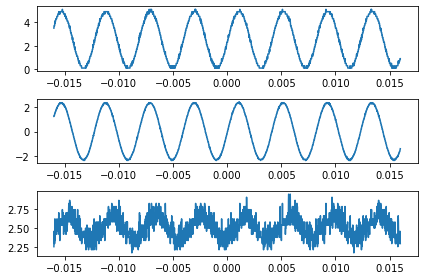

Trabajando con frecuencia 292.5211313540288 Hz


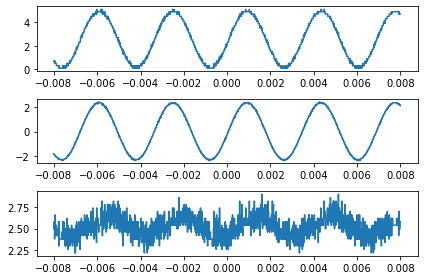

Trabajando con frecuencia 350.51898075037633 Hz


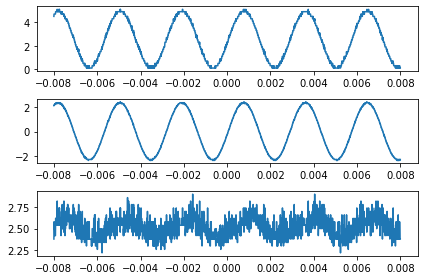

Trabajando con frecuencia 420.0160012289328 Hz


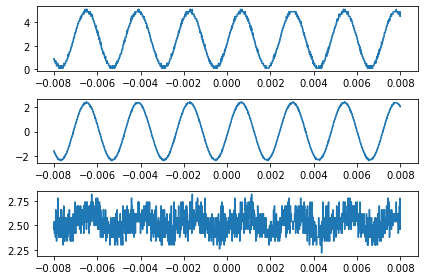

Trabajando con frecuencia 503.2921210448703 Hz


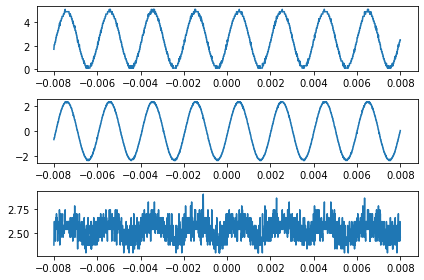

Trabajando con frecuencia 756.0556854722568 Hz


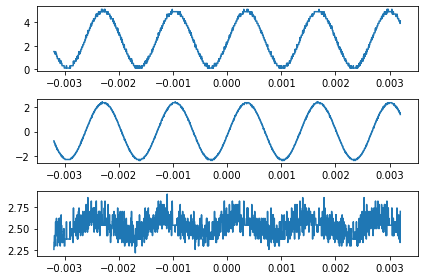

Trabajando con frecuencia 1135.7622653583362 Hz


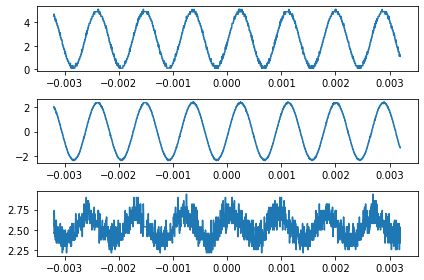

Trabajando con frecuencia 1706.1652312106505 Hz


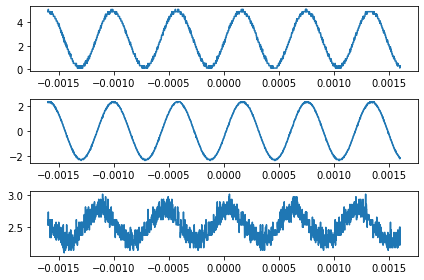

Trabajando con frecuencia 2563.0361960244036 Hz


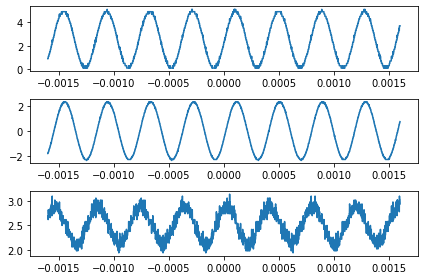

Trabajando con frecuencia 3850.245229455268 Hz


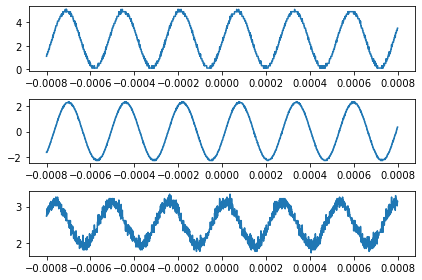

Trabajando con frecuencia 5783.916883396953 Hz


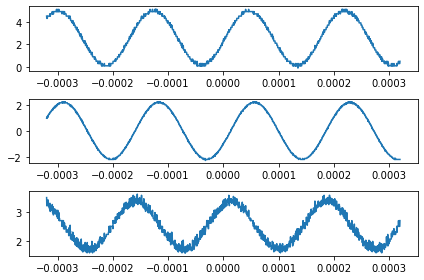

Trabajando con frecuencia 8688.7178661026 Hz


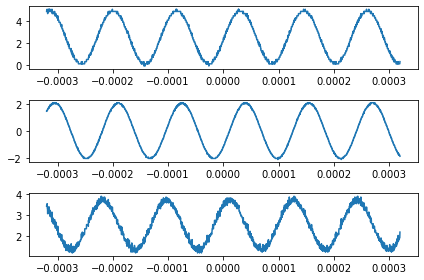

Trabajando con frecuencia 13052.369126091657 Hz


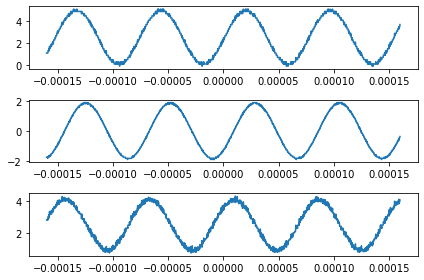

Trabajando con frecuencia 19607.53501599986 Hz


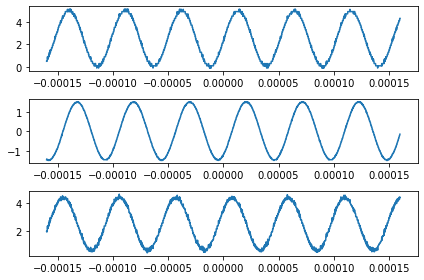

Trabajando con frecuencia 29454.83886409059 Hz


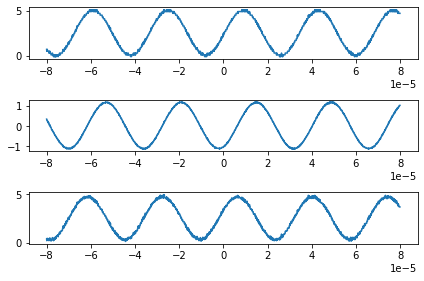

Trabajando con frecuencia 44247.65947384956 Hz


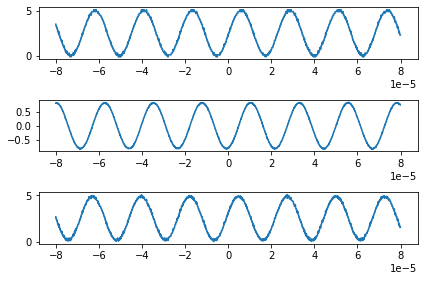

Trabajando con frecuencia 66469.73619335049 Hz


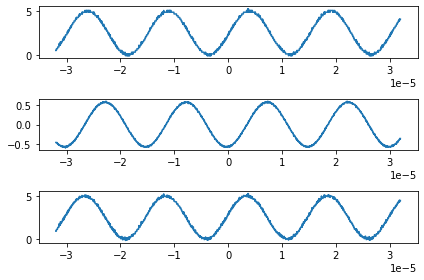

Trabajando con frecuencia 99852.1929103341 Hz


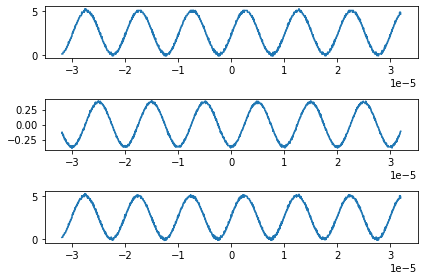

Trabajando con frecuencia 150000.0 Hz


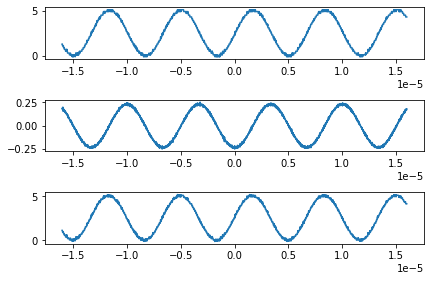

In [67]:
datasets = []

gen.write('C1:BSWV WVTP,SINE,AMP,5,OFST,2.5')

osc.write('DAT:ENC RPB')
osc.write('DAT:WID 1')
osc.write('HEADER OFF')

osc.write('SEL:CH1 ON')
osc.write('SEL:CH2 ON')

for f in frecuencias:
    print(f"Trabajando con frecuencia {f} Hz")
    gen.write('C1:BSWV FRQ,%f' % f)
    time.sleep(1)
    osc.write('AUTOS EXEC')
    time.sleep(5)
    osc.write('ACQ:STATE OFF')
    time.sleep(2)
    
    osc.write('DAT:SOU CH1')
    xze1, xin1, yze1, ymu1, yoff1 = osc.query_ascii_values('WFMOUTPRE:XZE?;XIN?;YZE?;YMU?;YOFF?;', separator=';')
    time.sleep(1.5)
    dataCH1 = osc.query_binary_values('CURV?', datatype='B', container=np.array) 
    time.sleep(1.5)
    
    osc.write('DAT:SOU CH2')
    xze2, xin2, yze2, ymu2, yoff2 = osc.query_ascii_values('WFMOUTPRE:XZE?;XIN?;YZE?;YMU?;YOFF?;', separator=';')
    time.sleep(1.5)           
    dataCH2 = osc.query_binary_values('CURV?', datatype='B', container=np.array) 
    time.sleep(1.5)
    
    osc.write('ACQ:STATE ON')

    ts = xze1 + np.arange(len(dataCH1)) * xin1
    VCH1s = (dataCH1 - yoff1) * ymu1 + yze1
    VCH2s = (dataCH2 - yoff2) * ymu2 + yze2
    
    datasets.append(pd.DataFrame({'ts': ts,'VCH1s': VCH1s,'VCH2s': VCH2s}))
    
    fig, ax = plt.subplots(3, 1)
    ax[0].plot(ts, VCH1s)
    ax[1].plot(ts, VCH2s)
    ax[2].plot(ts, VCH1s-VCH2s)
    plt.tight_layout()
    plt.show()

In [68]:
for i in range(len(datasets)):
    data = datasets[i]
    f = frecuencias[i]
    data.to_csv(f"./{f}.csv", index=False)

C:\Users\PUBLIC~1.LAB\AppData\Local\Temp/ipykernel_9852/2557878718.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (10, 6), dpi = 100)


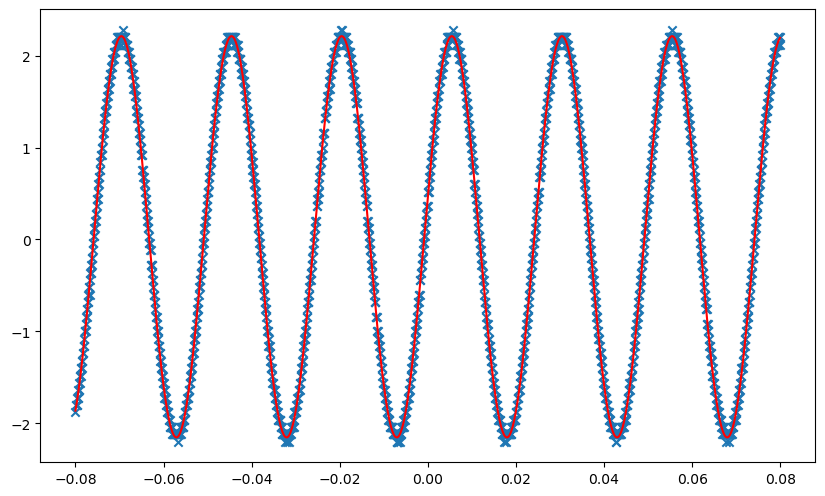

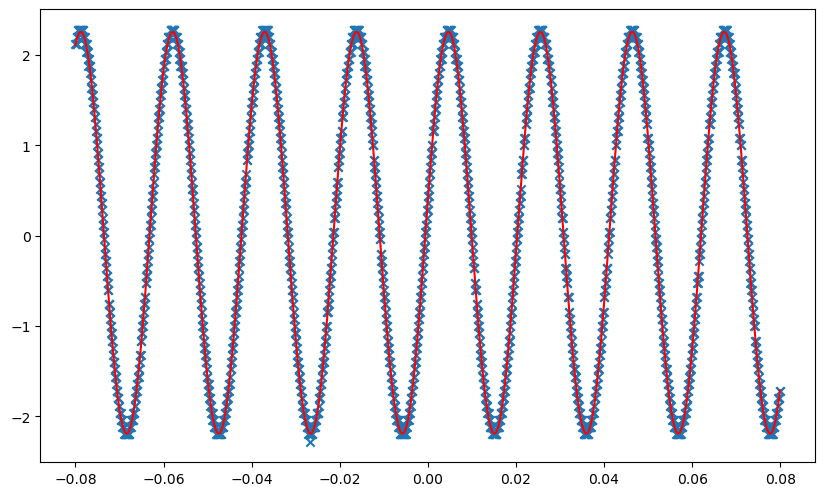

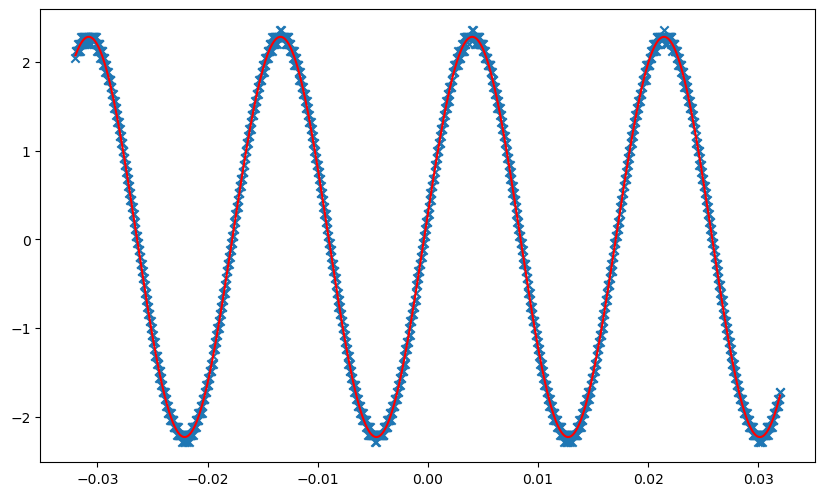

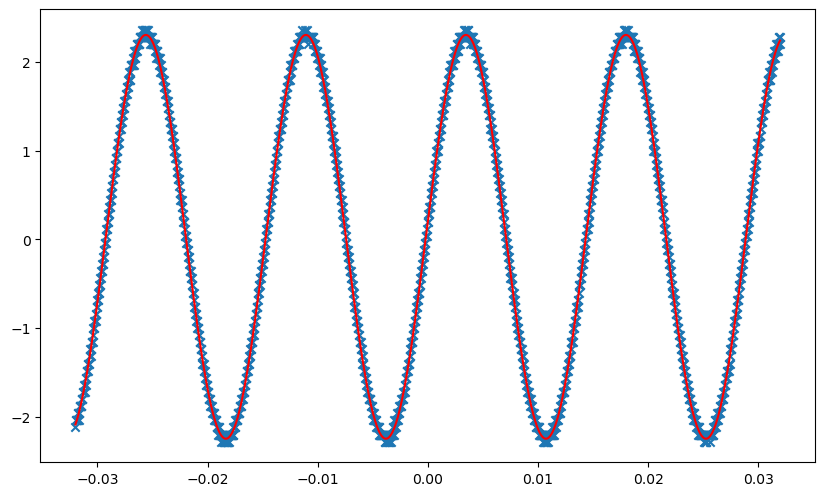

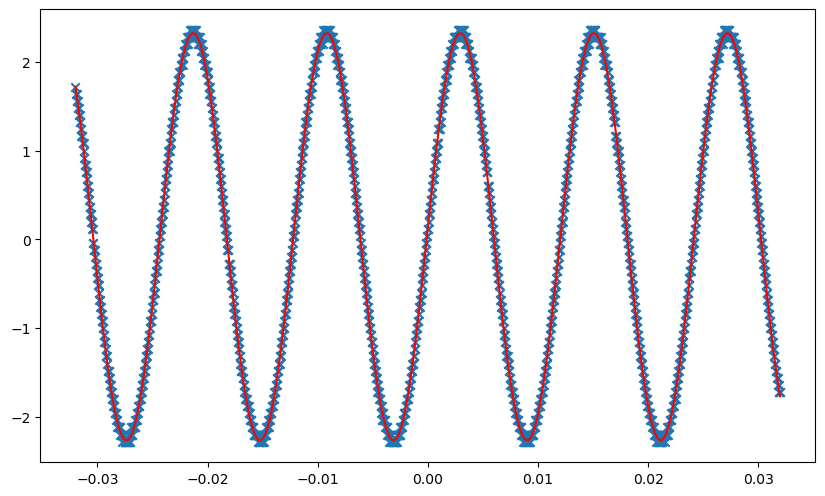

...

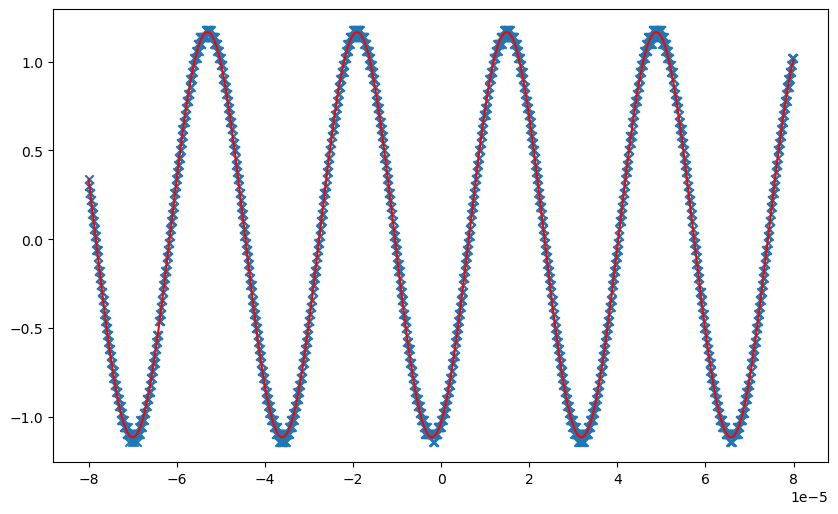

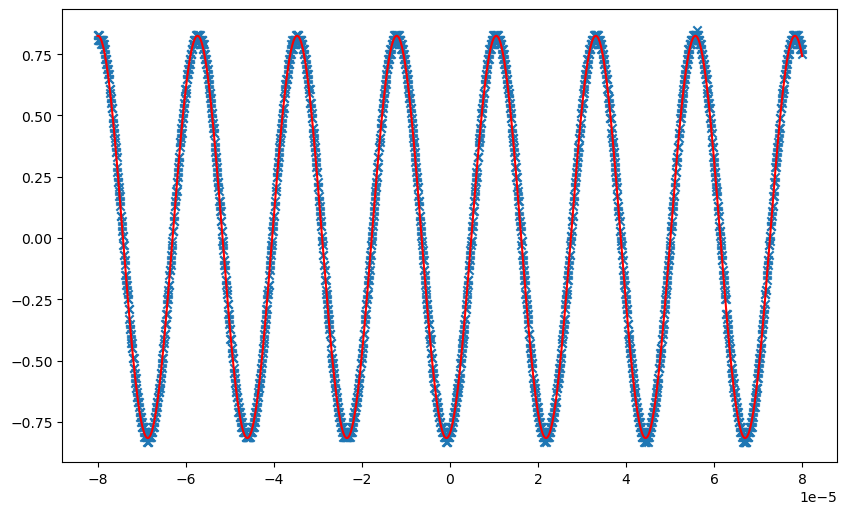

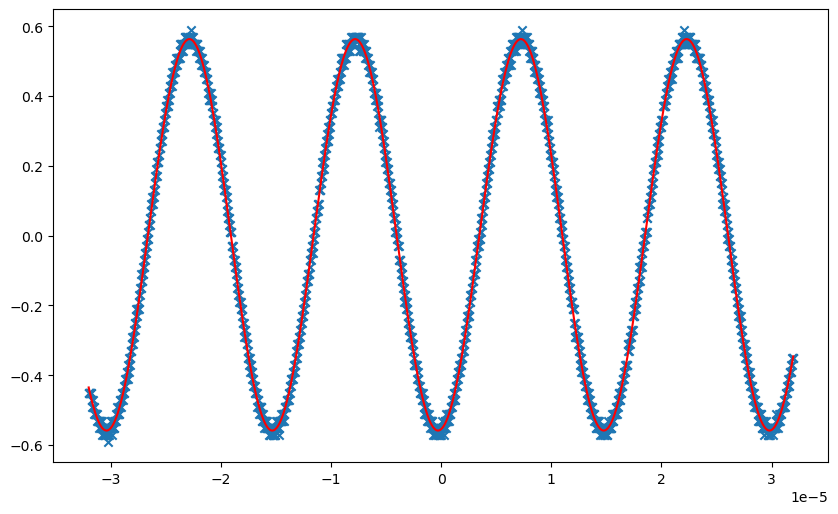

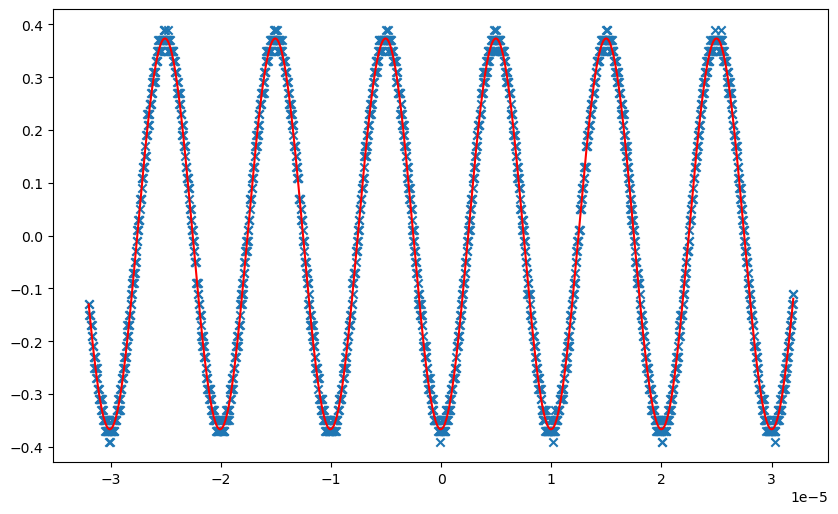

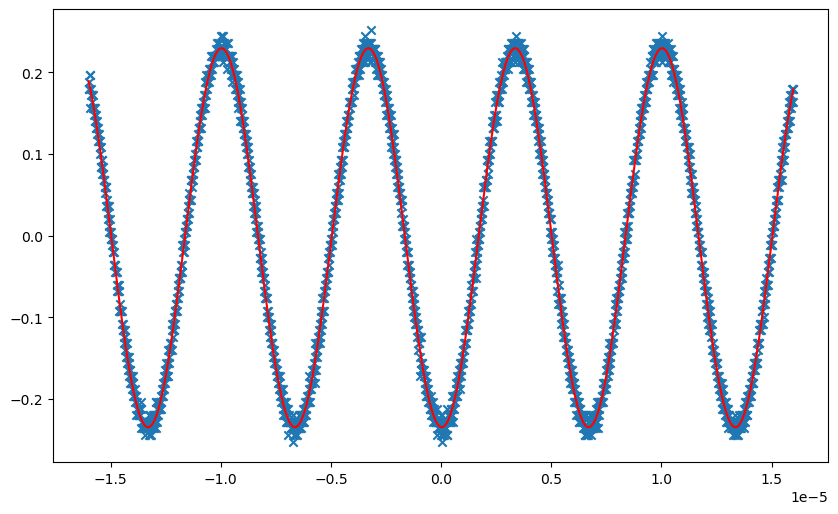

In [86]:
def sinusoide(t, A, w, phi, B):
    return A*np.sin(w*t + phi) + B

amplitudes = []
amplitudes_fuente = []
desfasajes = []

for i in range(len(datasets)):
    
    data = datasets[i]
    f = frecuencias[i]
    omega = 2*np.pi*f
    
    tdisc = data['ts']
    Vdisc = data['VCH2s']
    
    tcont = np.linspace(np.min(tdisc), np.max(tdisc), 1000)
    
    popt, pcov = opt.curve_fit(sinusoide, tdisc, Vdisc, p0=[0.3, omega, 0, 0])
    amplitudes.append(popt[0])
    
    poptfuente, pcovfuente = opt.curve_fit(sinusoide, tdisc, data['VCH1s'], p0=[2.5, omega, 0, 0])
    amplitudes_fuente.append(poptfuente[0])
    
    desfasajes.append(popt[3]-poptfuente[3])
    
    fig, ax = plt.subplots(figsize = (10, 6), dpi = 100)
    ax.scatter(tdisc, Vdisc, marker = 'x')
    ax.plot(tcont, sinusoide(tcont, *popt), color = 'red', zorder=1)     

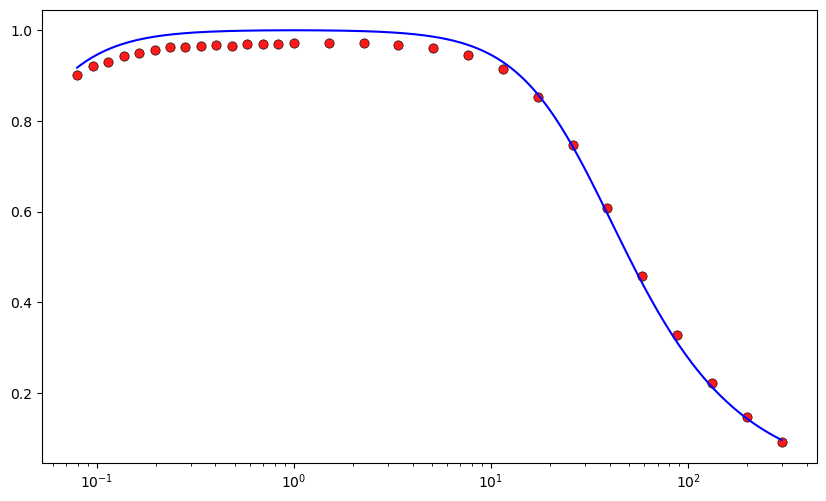

-0.03467759742187397


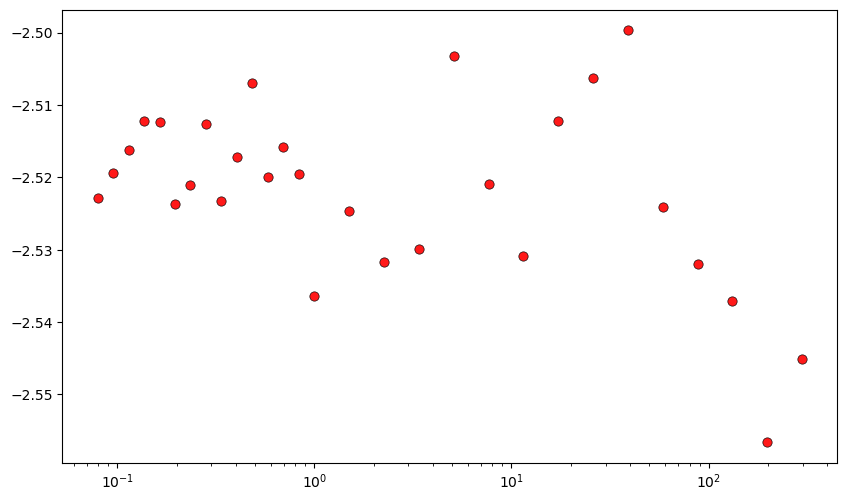

In [89]:
def transferencia(x, Q):
    return 1/(np.sqrt(1+Q**2*(x-1/x)**2))
amplitudes = np.array(amplitudes)
amplitudes_fuente = np.array(amplitudes_fuente)
popt, pcov = opt.curve_fit(transferencia, frecuencias/f0, amplitudes/amplitudes_fuente, p0 = [1.3])
Qest = popt[0]

frecs_cont = np.geomspace(np.min(frecuencias), np.max(frecuencias), 1000) / f0

fig, ax = plt.subplots(figsize = (10,6), dpi = 100)
plt.xscale('log')
ax.scatter(frecuencias/f0, amplitudes/amplitudes_fuente, color = 'red', s=45,alpha=0.9,edgecolors="k",linewidths=0.5,)
ax.plot(frecs_cont, transferencia(frecs_cont, *popt), color = 'blue', zorder = 1)
plt.show() 
print(Qest)

fig, ax = plt.subplots(figsize = (10,6), dpi = 100)
plt.xscale('log')
ax.scatter(frecuencias/f0, desfasajes, color = 'red', s=45, alpha = 0.9, edgecolors = 'k', linewidths = 0.5)

In [83]:
amplitudes_fuente

[2.4226033126325106,
 2.4163255650796467,
 2.422133504048036,
 2.4141377247125164,
 2.416476525980477,
 2.4118616175479555,
 2.4070606944863466,
 2.4109039102095533,
 2.4155814739275625,
 2.4123259755741793,
 2.4161397964504356,
 2.4100984950115087,
 2.4123305454557737,
 2.4142956304146233,
 2.4120601651502764,
 2.407903832436053,
 2.4092120138059268,
 2.412030694424238,
 2.4122661425313443,
 2.4187184442653282,
 2.420154294193904,
 2.431989205600838,
 2.4501260366396957,
 2.4660273933192176,
 2.496836366448476,
 2.505450128182788,
 2.5162400367800872,
 2.528698726424942,
 2.528764151327484]

In [ ]:
datasets_ruido = []

osc.write('DAT:ENC RPB')
osc.write('DAT:WID 1')
osc.write('HEADER OFF')

osc.write('SEL:CH1 ON')
osc.write('SEL:CH2 ON')

escalas = np.array([])

for f in frecuencias:
    print(f"Trabajando con frecuencia {f} Hz")
    gen.write('C1:BSWV FRQ,%f' % f)
    time.sleep(1)
    osc.write('AUTOS EXEC')
    time.sleep(5)
    osc.write('ACQ:STATE OFF')
    time.sleep(2)
    
    osc.write('DAT:SOU CH1')
    xze1, xin1, yze1, ymu1, yoff1 = osc.query_ascii_values('WFMOUTPRE:XZE?;XIN?;YZE?;YMU?;YOFF?;', separator=';')
    time.sleep(1.5)
    dataCH1 = osc.query_binary_values('CURV?', datatype='B', container=np.array) 
    time.sleep(1.5)
    
    osc.write('DAT:SOU CH2')
    xze2, xin2, yze2, ymu2, yoff2 = osc.query_ascii_values('WFMOUTPRE:XZE?;XIN?;YZE?;YMU?;YOFF?;', separator=';')
    time.sleep(1.5)           
    dataCH2 = osc.query_binary_values('CURV?', datatype='B', container=np.array) 
    time.sleep(1.5)
    
    osc.write('ACQ:STATE ON')

    ts = xze1 + np.arange(len(dataCH1)) * xin1
    VCH1s = (dataCH1 - yoff1) * ymu1 + yze1
    VCH2s = (dataCH2 - yoff2) * ymu2 + yze2
    
    datasets.append(pd.DataFrame({'ts': ts,'VCH1s': VCH1s,'VCH2s': VCH2s}))
    
    fig, ax = plt.subplots(3, 1)
    ax[0].plot(ts, VCH1s)
    ax[1].plot(ts, VCH2s)
    ax[2].plot(ts, VCH1s-VCH2s)
    plt.tight_layout()
    plt.show()

In [125]:
L = 1 # Henrios
#R1 = 99000 # Ohmios
#R2 = 99.4 # Ohmios
#R3 = 19.0 # Ohmios
R = 632 # Ohmios
#C1 = 0.0001 # Faradios
C = 0.00001 # Faradios

w0 = 1/np.sqrt(L*C)
f0 = w0/(2*np.pi)
Q = np.sqrt(L/C)/R

print(f"La frecuencia angular de corte es {w0} rad/s")
print(f"La frecuencia de corte es {f0} Hz")
print(f"La Q es {Q}")

La frecuencia angular de corte es 316.2277660168379 rad/s
La frecuencia de corte es 50.329212104487034 Hz
La Q es 0.5003603892671485


In [126]:
f_min = 40.0     # Límite inferior arbitrario
f_max = 150000.0  # Límite superior arbitrario
N_por_lado = 6  # Puntos en cada mitad (total: 2*N_por_lado - 1 = 29)

# Genera desde f_min hasta f0, y desde f0 hasta f_max sin duplicar f0
lado_izq = np.geomspace(f_min, f0, num=N_por_lado)
lado_der = np.geomspace(f0, f_max, num=N_por_lado)[1:]

frecuencias = np.concatenate([lado_izq, lado_der])

Trabajando con frecuencia 40.0 Hz


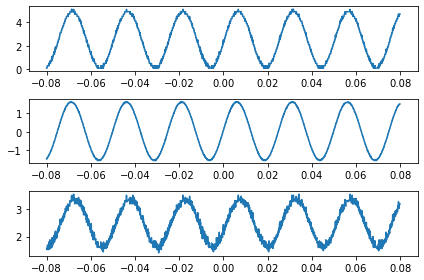

Trabajando con frecuencia 41.880515567079556 Hz


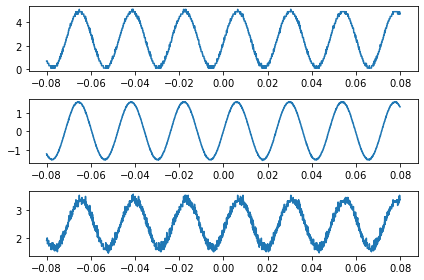

Trabajando con frecuencia 43.84943960410983 Hz


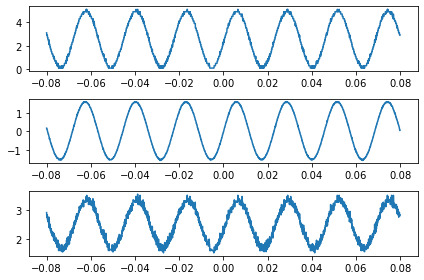

Trabajando con frecuencia 45.910928448690925 Hz


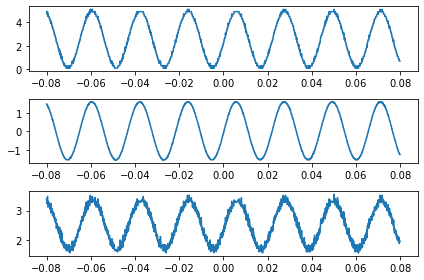

Trabajando con frecuencia 48.069333839861905 Hz


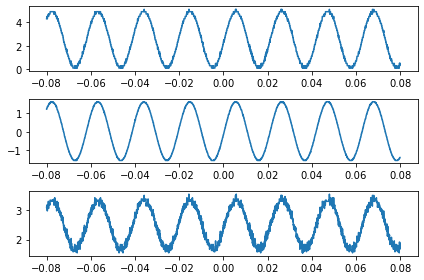

Trabajando con frecuencia 50.329212104487034 Hz


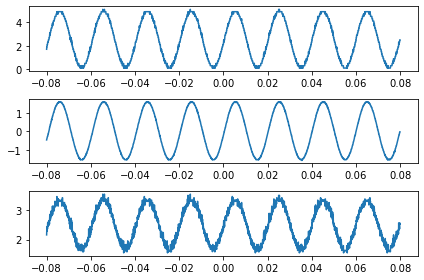

Trabajando con frecuencia 249.2724929944639 Hz


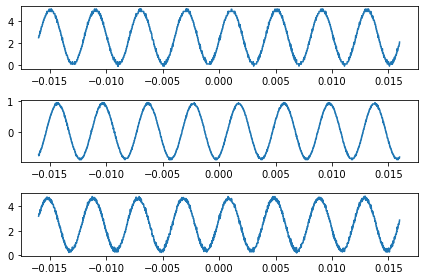

Trabajando con frecuencia 1234.6065667524203 Hz


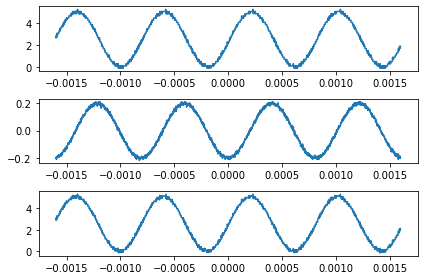

Trabajando con frecuencia 6114.807760606179 Hz


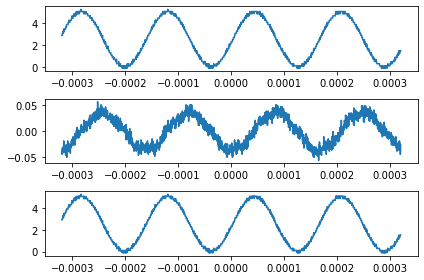

Trabajando con frecuencia 30285.659380157616 Hz


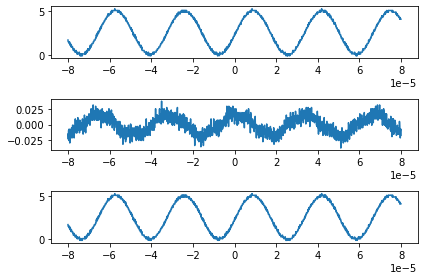

Trabajando con frecuencia 150000.0 Hz


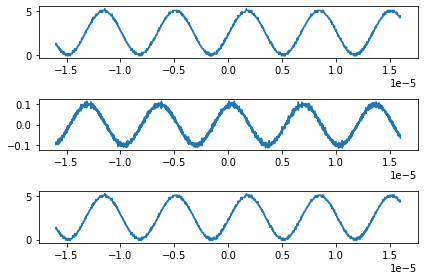

In [127]:
datasets = []

gen.write('C1:BSWV WVTP,SINE,AMP,5,OFST,2.5')

osc.write('DAT:ENC RPB')
osc.write('DAT:WID 1')
osc.write('HEADER OFF')

osc.write('SEL:CH1 ON')
osc.write('SEL:CH2 ON')

for f in frecuencias:
    print(f"Trabajando con frecuencia {f} Hz")
    gen.write('C1:BSWV FRQ,%f' % f)
    time.sleep(1)
    osc.write('AUTOS EXEC')
    time.sleep(5)
    osc.write('ACQ:STATE OFF')
    time.sleep(2)
    
    osc.write('DAT:SOU CH1')
    xze1, xin1, yze1, ymu1, yoff1 = osc.query_ascii_values('WFMOUTPRE:XZE?;XIN?;YZE?;YMU?;YOFF?;', separator=';')
    time.sleep(1.5)
    dataCH1 = osc.query_binary_values('CURV?', datatype='B', container=np.array) 
    time.sleep(1.5)
    
    osc.write('DAT:SOU CH2')
    xze2, xin2, yze2, ymu2, yoff2 = osc.query_ascii_values('WFMOUTPRE:XZE?;XIN?;YZE?;YMU?;YOFF?;', separator=';')
    time.sleep(1.5)           
    dataCH2 = osc.query_binary_values('CURV?', datatype='B', container=np.array) 
    time.sleep(1.5)
    
    osc.write('ACQ:STATE ON')

    ts = xze1 + np.arange(len(dataCH1)) * xin1
    VCH1s = (dataCH1 - yoff1) * ymu1 + yze1
    VCH2s = (dataCH2 - yoff2) * ymu2 + yze2
    
    datasets.append(pd.DataFrame({'ts': ts,'VCH1s': VCH1s,'VCH2s': VCH2s}))
    
    fig, ax = plt.subplots(3, 1)
    ax[0].plot(ts, VCH1s)
    ax[1].plot(ts, VCH2s)
    ax[2].plot(ts, VCH1s-VCH2s)
    plt.tight_layout()
    plt.show()

In [128]:
for i in range(len(datasets)):
    data = datasets[i]
    f = frecuencias[i]
    data.to_csv(f"./{f}.csv", index=False)

C:\Users\PUBLIC~1.LAB\AppData\Local\Temp/ipykernel_9852/2557878718.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (10, 6), dpi = 100)


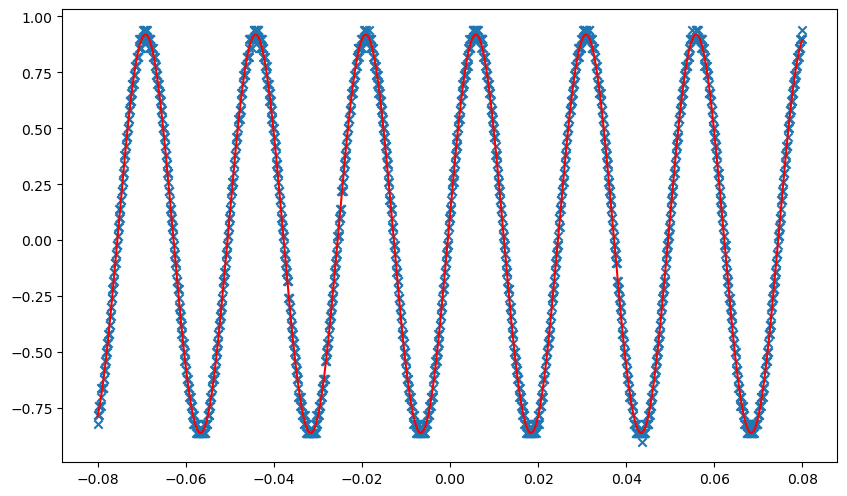

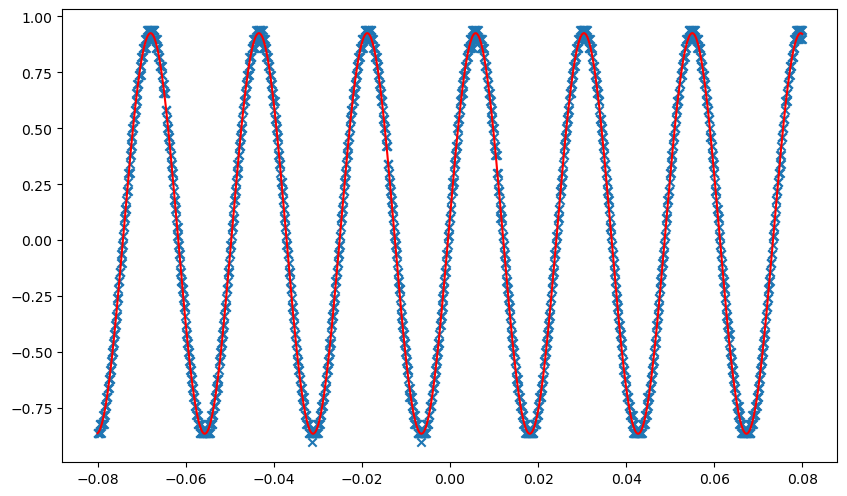

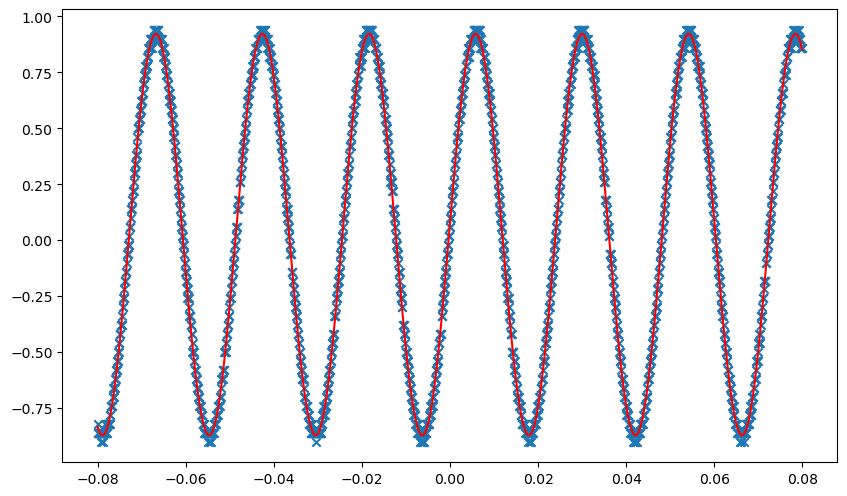

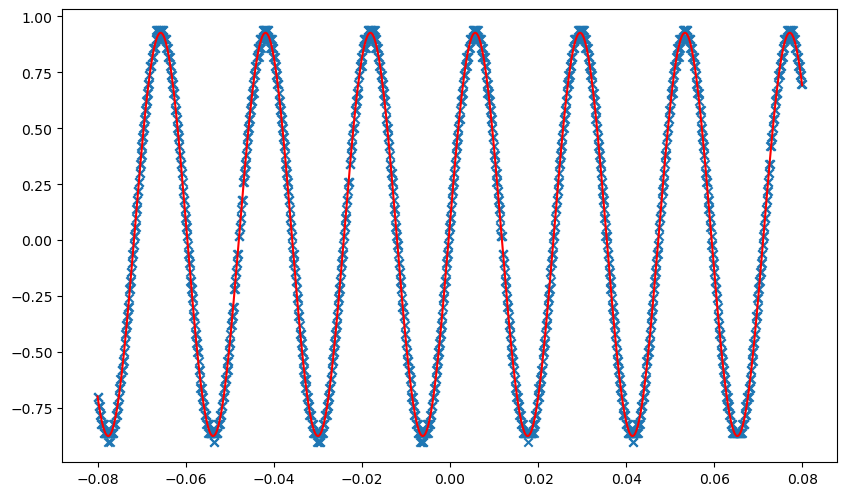

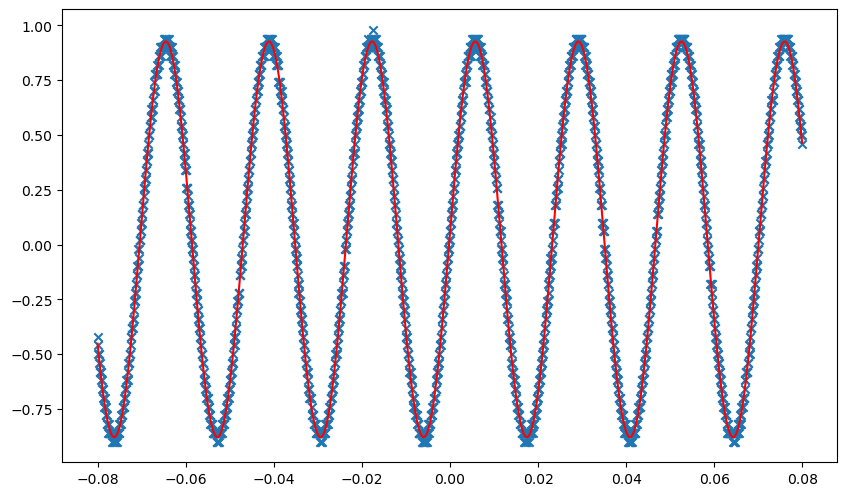

...

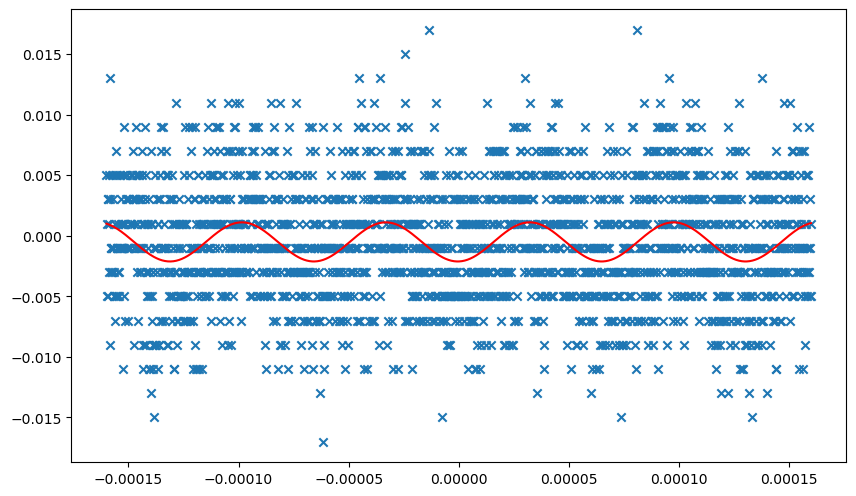

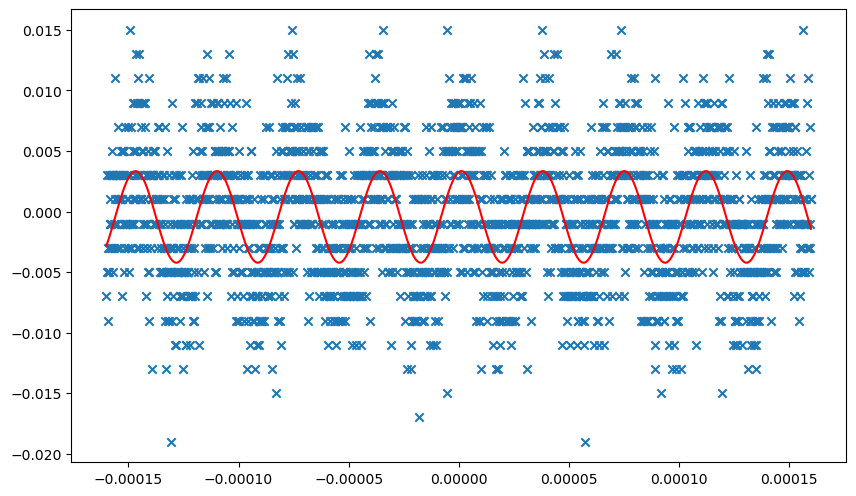

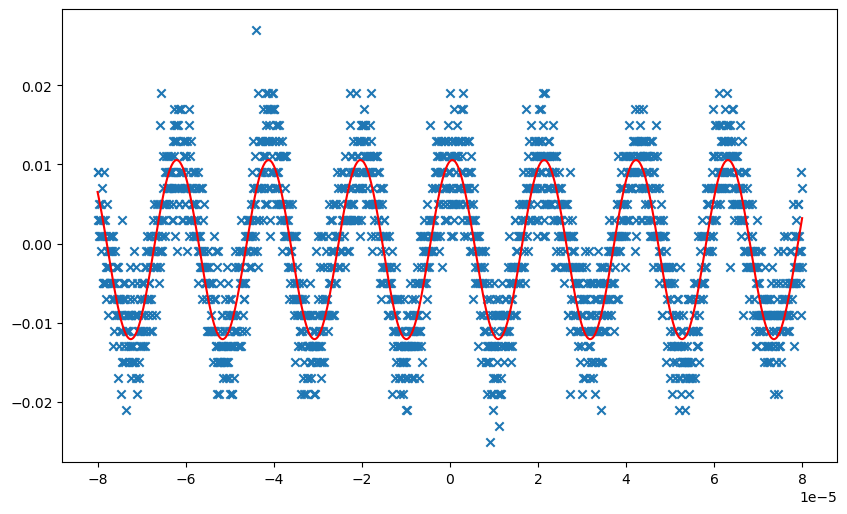

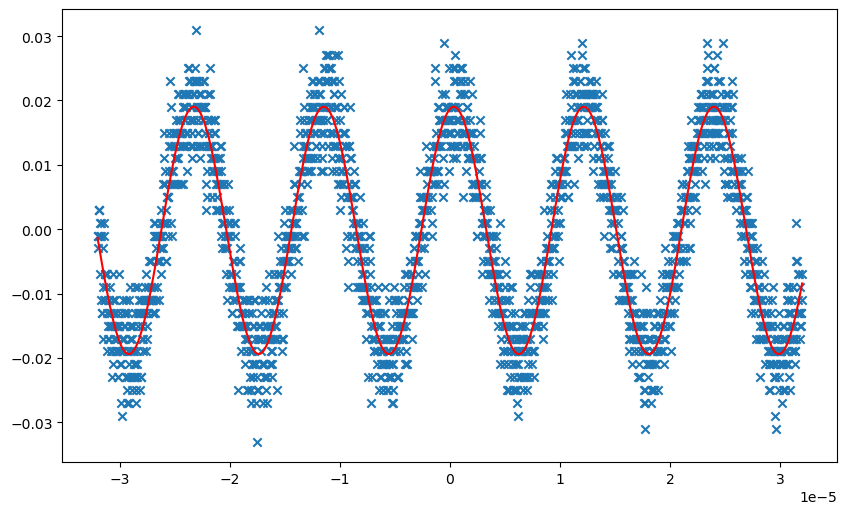

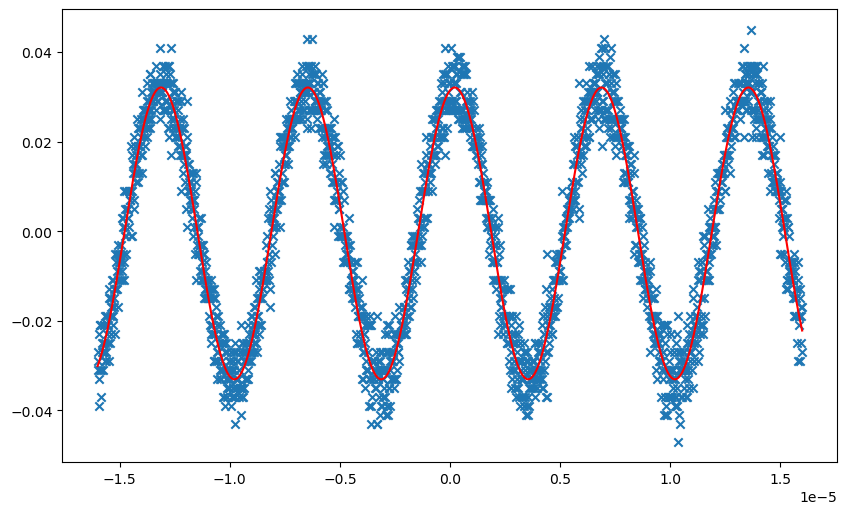

In [113]:
def sinusoide(t, A, w, phi, B):
    return A*np.sin(w*t + phi) + B

amplitudes = []
amplitudes_fuente = []
desfasajes = []

for i in range(len(datasets)):
    
    data = datasets[i]
    f = frecuencias[i]
    omega = 2*np.pi*f
    
    tdisc = data['ts']
    Vdisc = data['VCH2s']
    
    tcont = np.linspace(np.min(tdisc), np.max(tdisc), 1000)
    
    popt, pcov = opt.curve_fit(sinusoide, tdisc, Vdisc, p0=[0.3, omega, 0, 0])
    amplitudes.append(popt[0])
    
    poptfuente, pcovfuente = opt.curve_fit(sinusoide, tdisc, data['VCH1s'], p0=[2.5, omega, 0, 0])
    amplitudes_fuente.append(poptfuente[0])
    
    desfasajes.append(popt[3]-poptfuente[3])
    
    fig, ax = plt.subplots(figsize = (10, 6), dpi = 100)
    ax.scatter(tdisc, Vdisc, marker = 'x')
    ax.plot(tcont, sinusoide(tcont, *popt), color = 'red', zorder=1)     

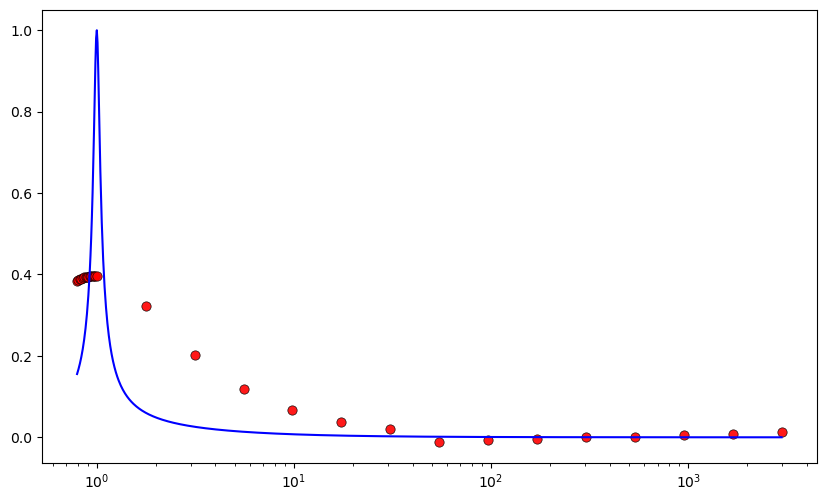

13.715094398656941


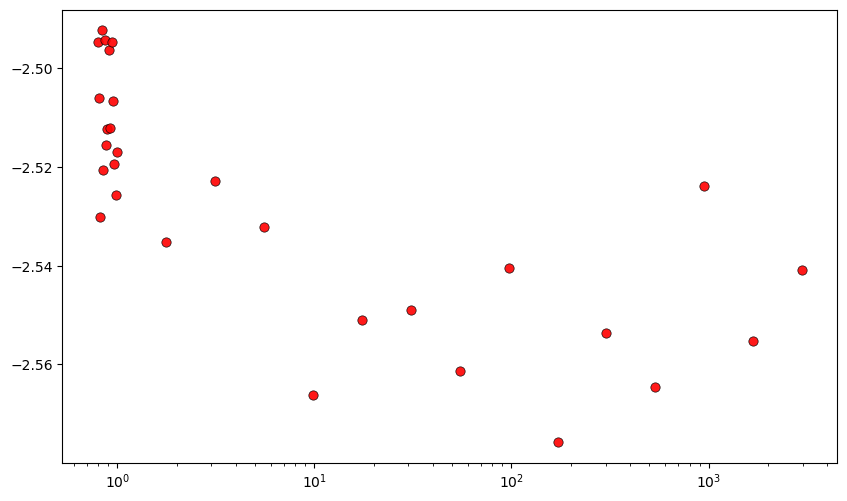

In [114]:
def transferencia(x, Q):
    return 1/(np.sqrt(1+Q**2*(x-1/x)**2))
amplitudes = np.array(amplitudes)
amplitudes_fuente = np.array(amplitudes_fuente)
popt, pcov = opt.curve_fit(transferencia, frecuencias/f0, amplitudes/amplitudes_fuente, p0 = [1.3])
Qest = popt[0]

frecs_cont = np.geomspace(np.min(frecuencias), np.max(frecuencias), 1000) / f0

fig, ax = plt.subplots(figsize = (10,6), dpi = 100)
plt.xscale('log')
ax.scatter(frecuencias/f0, amplitudes/amplitudes_fuente, color = 'red', s=45,alpha=0.9,edgecolors="k",linewidths=0.5,)
ax.plot(frecs_cont, transferencia(frecs_cont, *popt), color = 'blue', zorder = 1)
plt.show() 
print(Qest)

fig, ax = plt.subplots(figsize = (10,6), dpi = 100)
plt.xscale('log')
ax.scatter(frecuencias/f0, desfasajes, color = 'red', s=45, alpha = 0.9, edgecolors = 'k', linewidths = 0.5)